<a href="https://colab.research.google.com/github/baldeoJV/CCADMACL_EXAM_COM222ML/blob/main/Midterm_Exam_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CCADMACL (Midterm Exam)

## Import the libraries

In [473]:
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

from collections import Counter

## Load the datasets

In [474]:
face_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/face.csv?raw=true")
chrome_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/chrome.csv?raw=true")
lines2_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/lines2.csv?raw=true")
supernova_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/supernova.csv?raw=true")
network_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/network.csv?raw=true")
spirals_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/spirals.csv?raw=true")
densedisk_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/densedisk.csv?raw=true")
rings_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/rings.csv?raw=true")
chainlink_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/chainlink.csv?raw=true")

## Plot the datasets

In [475]:
# fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(13, 13))
# fig.suptitle('DATA SETS\n', size=18)

# # Plot the 2D scatterplots
# axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
# axes[0, 0].set_title("face")

# axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
# axes[0, 1].set_title("chrome")

# axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
# axes[0, 2].set_title("lines")

# axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
# axes[1, 0].set_title("supernova")

# axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
# axes[1, 1].set_title("network")

# axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
# axes[1, 2].set_title("spirals")

# axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
# axes[2, 0].set_title("densedisk")

# axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
# axes[2, 1].set_title("rings")

# # Add a 3D plot
# ax3d = fig.add_subplot(3, 3, 9, projection='3d')
# ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
# ax3d.set_title("3D chainlink")
# ax3d.set_xlabel("X")
# ax3d.set_ylabel("Y")
# ax3d.set_zlabel("Z")

# # Adjust layout
# plt.tight_layout(rect=[0, 0, 1, 0.95])

## A. Use K-means to cluster each dataset

1. Create each copy of the dataset for k-means

In [503]:
face_df_kmeans = face_df.copy()
chrome_df_kmeans = chrome_df.copy()
lines2_df_kmeans = lines2_df.copy()
supernova_df_kmeans = supernova_df.copy()
network_df_kmeans = network_df.copy()
spirals_df_kmeans = spirals_df.copy()
densedisk_df_kmeans = densedisk_df.copy()
rings_df_kmeans = rings_df.copy()
chainlink_df_kmeans = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [504]:
datasets = [face_df_kmeans, chrome_df_kmeans, lines2_df_kmeans, supernova_df_kmeans,
            network_df_kmeans, spirals_df_kmeans, densedisk_df_kmeans, rings_df_kmeans,
            chainlink_df_kmeans]

for dataset in datasets:
    if 'color' in dataset.columns:
        dataset.drop(columns=['color'], inplace=True)

3. Train a K-means model for each dataset.

In [505]:
# Training model
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)

kmeans_face = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_chrome = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_lines2 = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
kmeans_supernova = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_network = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
kmeans_spirals = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans_densedisk = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
kmeans_rings = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans_chainlink = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)

y_kmeans_face= kmeans_face.fit_predict(face_df_kmeans)
y_kmeans_chrome= kmeans_chrome.fit_predict(chrome_df_kmeans)
y_kmeans_lines2= kmeans_lines2.fit_predict(lines2_df_kmeans)
y_kmeans_supernova= kmeans_supernova.fit_predict(supernova_df_kmeans)
y_kmeans_network= kmeans_network.fit_predict(network_df_kmeans)
y_kmeans_spirals= kmeans_spirals.fit_predict(spirals_df_kmeans)
y_kmeans_densedisk= kmeans_densedisk.fit_predict(densedisk_df_kmeans)
y_kmeans_rings= kmeans_rings.fit_predict(rings_df_kmeans)
y_kmeans_chainlink= kmeans_chainlink.fit_predict(chainlink_df_kmeans)




4. Add a "Cluster" column for each data set

In [506]:
# Creating 'Cluster' columns in data sets
datasets = [face_df_kmeans, chrome_df_kmeans, lines2_df_kmeans, supernova_df_kmeans,
            network_df_kmeans, spirals_df_kmeans, densedisk_df_kmeans, rings_df_kmeans,
            chainlink_df_kmeans]

kmeans = [y_kmeans_face, y_kmeans_chrome, y_kmeans_lines2, y_kmeans_supernova,
            y_kmeans_network, y_kmeans_spirals, y_kmeans_densedisk, y_kmeans_rings,
            y_kmeans_chainlink]

for dataset, k in zip(datasets, kmeans):
    dataset['Cluster'] = k

5. Plot the Correct cluster and the K-means cluster

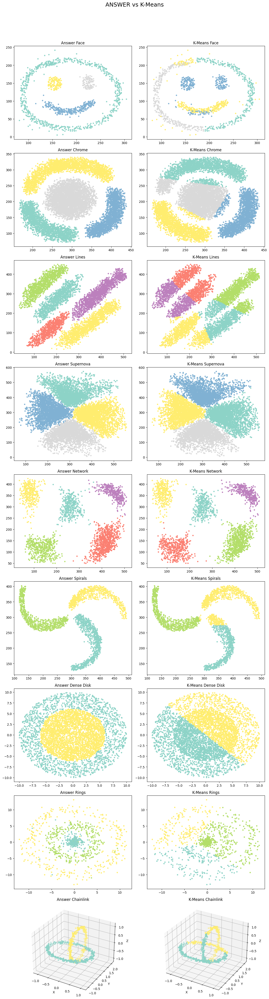

In [507]:
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plots

fig = plt.figure(figsize=(12, 45))  # Increase figure height for better spacing
fig.suptitle('ANSWER vs K-Means\n', size=18)

datasets_answer = [face_df, chrome_df, lines2_df, supernova_df,
                   network_df, spirals_df, densedisk_df, rings_df,
                   chainlink_df]

datasets_kmeans = [face_df_kmeans, chrome_df_kmeans, lines2_df_kmeans, supernova_df_kmeans,
                   network_df_kmeans, spirals_df_kmeans, densedisk_df_kmeans, rings_df_kmeans,
                   chainlink_df_kmeans]

titles = ["Face", "Chrome", "Lines", "Supernova", "Network",
          "Spirals", "Dense Disk", "Rings", "Chainlink"]

# Create subplots for the 2D datasets
axes_2d = [fig.add_subplot(9, 2, i + 1) for i in range(16)]

# Iterate through the datasets and create scatter plots
for i, (answer, kmeans, title) in enumerate(zip(datasets_answer[:-1], datasets_kmeans[:-1], titles[:-1])):
    # Left column: Answer
    axes_2d[2 * i].scatter(answer['x'], answer['y'], c=answer['color'], s=10, cmap="Set3")
    axes_2d[2 * i].set_title(f"Answer {title}")

    # Right column: K-Means
    axes_2d[2 * i + 1].scatter(kmeans['x'], kmeans['y'], c=kmeans['Cluster'], s=10, cmap="Set3")
    axes_2d[2 * i + 1].set_title(f"K-Means {title}")

# Add 3D scatter plots for Chainlink
ax_answer_chainlink = fig.add_subplot(9, 2, 17, projection='3d')
ax_kmeans_chainlink = fig.add_subplot(9, 2, 18, projection='3d')

# Left 3D plot: Answer Chainlink
ax_answer_chainlink.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'],
                            c=chainlink_df['color'], s=10, cmap="Set3")
ax_answer_chainlink.set_title("Answer Chainlink")
ax_answer_chainlink.set_xlabel("X")
ax_answer_chainlink.set_ylabel("Y")
ax_answer_chainlink.set_zlabel("Z")

# Right 3D plot: K-Means Chainlink
ax_kmeans_chainlink.scatter(chainlink_df_kmeans['x'], chainlink_df_kmeans['y'], chainlink_df_kmeans['z'],
                            c=chainlink_df_kmeans['Cluster'], s=10, cmap="Set3")
ax_kmeans_chainlink.set_title("K-Means Chainlink")
ax_kmeans_chainlink.set_xlabel("X")
ax_kmeans_chainlink.set_ylabel("Y")
ax_kmeans_chainlink.set_zlabel("Z")

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Reserve space for the suptitle
plt.show()


## B. Use Agglomerative Clustering to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

In [481]:
face_df_agglo = face_df.copy()
chrome_df_agglo = chrome_df.copy()
lines2_df_agglo = lines2_df.copy()
supernova_df_agglo = supernova_df.copy()
network_df_agglo = network_df.copy()
spirals_df_agglo = spirals_df.copy()
densedisk_df_agglo = densedisk_df.copy()
rings_df_agglo = rings_df.copy()
chainlink_df_agglo = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [482]:
dataset = [face_df_agglo, chrome_df_agglo, lines2_df_agglo, supernova_df_agglo,
           network_df_agglo, spirals_df_agglo,densedisk_df_agglo, rings_df_agglo,
           chainlink_df_agglo]

for dataset in datasets:
    if 'color' in dataset.columns:
        dataset.drop(columns=['color'], inplace=True)

3. Train a Agglomerative Clustering model for each dataset.

In [483]:
from sklearn.cluster import AgglomerativeClustering

# Models with shorter names
Agglo_face = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
Agglo_chrome = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
Agglo_lines = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
Agglo_supernova = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
Agglo_network = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
Agglo_spirals = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
Agglo_densedisk = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
Agglo_rings = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
Agglo_chainlink = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')

# Predicting clusters
y_Agglo_face = Agglo_face.fit_predict(face_df_agglo)
y_Agglo_chrome = Agglo_chrome.fit_predict(chrome_df_agglo)
y_Agglo_lines = Agglo_lines.fit_predict(lines2_df_agglo)
y_Agglo_supernova = Agglo_supernova.fit_predict(supernova_df_agglo)
y_Agglo_network = Agglo_network.fit_predict(network_df_agglo)
y_Agglo_spirals = Agglo_spirals.fit_predict(spirals_df_agglo)
y_Agglo_densedisk = Agglo_densedisk.fit_predict(densedisk_df_agglo)
y_Agglo_rings = Agglo_rings.fit_predict(rings_df_agglo)
y_Agglo_chainlink = Agglo_chainlink.fit_predict(chainlink_df_agglo)


4. Add a "Cluster" column for each data set

In [484]:
# Creating 'Cluster' columns in data sets
dataset = [face_df_agglo, chrome_df_agglo, lines2_df_agglo, supernova_df_agglo,
           network_df_agglo, spirals_df_agglo,densedisk_df_agglo, rings_df_agglo,
           chainlink_df_agglo]

agglo = [y_Agglo_face, y_Agglo_chrome, y_Agglo_lines, y_Agglo_supernova,
         y_Agglo_network, y_Agglo_spirals, y_Agglo_densedisk, y_Agglo_rings,
         y_Agglo_chainlink]


for dataset, k in zip(datasets, agglo):
    dataset['Cluster'] = k

5. Plot the Correct cluster and the Agglomerative cluster

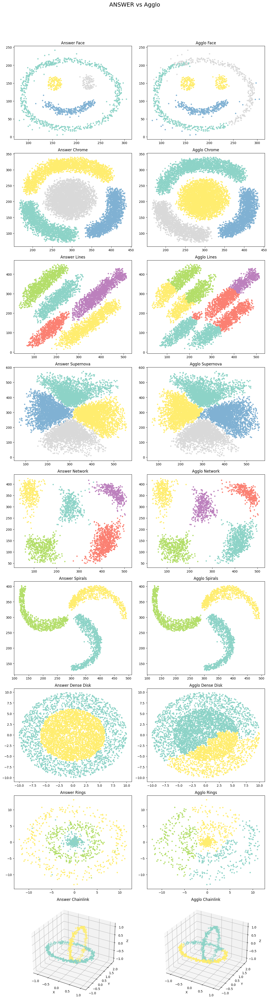

In [485]:
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plots

fig = plt.figure(figsize=(12, 45))  # Increase figure height for better spacing
fig.suptitle('ANSWER vs Agglo\n', size=18)

# Arrays
datasets_answer = [face_df, chrome_df, lines2_df, supernova_df,
                   network_df, spirals_df, densedisk_df, rings_df,
                   chainlink_df]

agglo = [y_Agglo_face, y_Agglo_chrome, y_Agglo_lines, y_Agglo_supernova,
         y_Agglo_network, y_Agglo_spirals, y_Agglo_densedisk, y_Agglo_rings,
         y_Agglo_chainlink]

titles = ["Face", "Chrome", "Lines", "Supernova", "Network",
          "Spirals", "Dense Disk", "Rings", "Chainlink"]

# Create subplots for the 2D datasets
axes_2d = [fig.add_subplot(9, 2, i + 1) for i in range(16)]

# Iterate through the datasets and create scatter plots
for i, (answer, labels, title) in enumerate(zip(datasets_answer[:-1], agglo[:-1], titles[:-1])):
    # Left column: Answer
    axes_2d[2 * i].scatter(answer['x'], answer['y'], c=answer['color'], s=10, cmap="Set3")
    axes_2d[2 * i].set_title(f"Answer {title}")

    # Right column: Agglo
    axes_2d[2 * i + 1].scatter(answer['x'], answer['y'], c=labels, s=10, cmap="Set3")
    axes_2d[2 * i + 1].set_title(f"Agglo {title}")

# Add 3D scatter plots for Chainlink
ax_answer_chainlink = fig.add_subplot(9, 2, 17, projection='3d')
ax_agglo_chainlink = fig.add_subplot(9, 2, 18, projection='3d')

# Left 3D plot: Answer Chainlink
ax_answer_chainlink.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'],
                            c=chainlink_df['color'], s=10, cmap="Set3")
ax_answer_chainlink.set_title("Answer Chainlink")
ax_answer_chainlink.set_xlabel("X")
ax_answer_chainlink.set_ylabel("Y")
ax_answer_chainlink.set_zlabel("Z")

# Right 3D plot: Agglo Chainlink
ax_agglo_chainlink.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'],
                           c=y_Agglo_chainlink, s=10, cmap="Set3")
ax_agglo_chainlink.set_title("Agglo Chainlink")
ax_agglo_chainlink.set_xlabel("X")
ax_agglo_chainlink.set_ylabel("Y")
ax_agglo_chainlink.set_zlabel("Z")

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Reserve space for the suptitle
plt.show()


## C. Use DBSCAN to cluster each dataset

1. Create each copy of the dataset for Agglomerative Clustering

In [486]:
face_df_dbScan = face_df.copy()
chrome_df_dbScan = chrome_df.copy()
lines2_df_dbScan = lines2_df.copy()
supernova_df_dbScan = supernova_df.copy()
network_df_dbScan = network_df.copy()
spirals_df_dbScan = spirals_df.copy()
densedisk_df_dbScan = densedisk_df.copy()
rings_df_dbScan = rings_df.copy()
chainlink_df_dbScan = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [487]:
dataset = [face_df_dbScan, chrome_df_dbScan, lines2_df_dbScan, supernova_df_dbScan,
           network_df_dbScan, spirals_df_dbScan,densedisk_df_dbScan, rings_df_dbScan,
           chainlink_df_dbScan]

for dataset in datasets:
    if 'color' in dataset.columns:
        dataset.drop(columns=['color'], inplace=True)

3. Train a DBSCAN Clustering model for each dataset.

In [488]:
from sklearn.cluster import DBSCAN

# Models with shorter names
dbScan_face = DBSCAN(eps=10, min_samples=4, metric='euclidean')
dbScan_chrome = DBSCAN(eps=8.1, min_samples=4, metric='euclidean')
dbScan_lines = DBSCAN(eps=10.1, min_samples=6, metric='euclidean')
dbScan_supernova = DBSCAN(eps=10, min_samples=16, metric='euclidean')
dbScan_network = DBSCAN(eps=20, min_samples=4, metric='euclidean')
dbScan_spirals = DBSCAN(eps=20, min_samples=5, metric='euclidean')
dbScan_densedisk = DBSCAN(eps=0.6, min_samples=3, metric='euclidean')

# dbScan_rings = DBSCAN(eps=1.8, min_samples=23, metric='euclidean')

dbScan_rings = DBSCAN(eps=3, min_samples=70, metric='euclidean')



dbScan_chainlink = DBSCAN(eps=0.6, min_samples=4, metric='euclidean')

# Predicting clusters
y_dbScan_face = dbScan_face.fit_predict(face_df_dbScan)
y_dbScan_chrome = dbScan_chrome.fit_predict(chrome_df_dbScan)
y_dbScan_lines = dbScan_lines.fit_predict(lines2_df_dbScan)
y_dbScan_supernova = dbScan_supernova.fit_predict(supernova_df_dbScan)
y_dbScan_network = dbScan_network.fit_predict(network_df_dbScan)
y_dbScan_spirals = dbScan_spirals.fit_predict(spirals_df_dbScan)
y_dbScan_densedisk = dbScan_densedisk.fit_predict(densedisk_df_dbScan)
y_dbScan_rings = dbScan_rings.fit_predict(rings_df_dbScan)
y_dbScan_chainlink = dbScan_chainlink.fit_predict(chainlink_df_dbScan)


4. Add a "Cluster" column for each data set

In [489]:
# Creating 'Cluster' columns in data sets
dataset = [face_df_dbScan, chrome_df_dbScan, lines2_df_dbScan, supernova_df_dbScan,
           network_df_dbScan, spirals_df_dbScan,densedisk_df_dbScan, rings_df_dbScan,
           chainlink_df_dbScan]

dbScan = [y_dbScan_face, y_dbScan_chrome, y_dbScan_lines, y_dbScan_supernova,
         y_dbScan_network, y_dbScan_spirals, y_dbScan_densedisk, y_dbScan_rings,
         y_dbScan_chainlink]


for dataset, k in zip(datasets, dbScan):
    dataset['Cluster'] = k


5. Plot the Correct cluster and the DBSCAN cluster

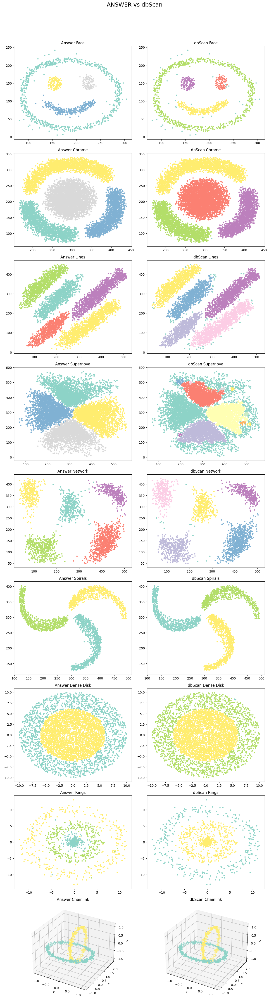

In [490]:
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plots

fig = plt.figure(figsize=(12, 45))  # Increase figure height for better spacing
fig.suptitle('ANSWER vs dbScan\n', size=18)

# Arrays
datasets_answer = [face_df, chrome_df, lines2_df, supernova_df,
                   network_df, spirals_df, densedisk_df, rings_df,
                   chainlink_df]

dbScan = [y_dbScan_face, y_dbScan_chrome, y_dbScan_lines, y_dbScan_supernova,
         y_dbScan_network, y_dbScan_spirals, y_dbScan_densedisk, y_dbScan_rings,
         y_dbScan_chainlink]

titles = ["Face", "Chrome", "Lines", "Supernova", "Network",
          "Spirals", "Dense Disk", "Rings", "Chainlink"]

# Create subplots for the 2D datasets
axes_2d = [fig.add_subplot(9, 2, i + 1) for i in range(16)]

# Iterate through the datasets and create scatter plots
for i, (answer, labels, title) in enumerate(zip(datasets_answer[:-1], dbScan[:-1], titles[:-1])):
    # Left column: Answer
    axes_2d[2 * i].scatter(answer['x'], answer['y'], c=answer['color'], s=10, cmap="Set3")
    axes_2d[2 * i].set_title(f"Answer {title}")

    # Right column: dbScan
    axes_2d[2 * i + 1].scatter(answer['x'], answer['y'], c=labels, s=10, cmap="Set3")
    axes_2d[2 * i + 1].set_title(f"dbScan {title}")

# Add 3D scatter plots for Chainlink
ax_answer_chainlink = fig.add_subplot(9, 2, 17, projection='3d')
ax_dbScan_chainlink = fig.add_subplot(9, 2, 18, projection='3d')

# Left 3D plot: Answer Chainlink
ax_answer_chainlink.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'],
                            c=chainlink_df['color'], s=10, cmap="Set3")
ax_answer_chainlink.set_title("Answer Chainlink")
ax_answer_chainlink.set_xlabel("X")
ax_answer_chainlink.set_ylabel("Y")
ax_answer_chainlink.set_zlabel("Z")

# Right 3D plot: dbScan Chainlink
ax_dbScan_chainlink.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'],
                           c=y_dbScan_chainlink, s=10, cmap="Set3")
ax_dbScan_chainlink.set_title("dbScan Chainlink")
ax_dbScan_chainlink.set_xlabel("X")
ax_dbScan_chainlink.set_ylabel("Y")
ax_dbScan_chainlink.set_zlabel("Z")

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Reserve space for the suptitle
plt.show()


## D. Compare all algorithms

1. Display the Correct cluster, K-means cluster, Agglomerative cluster and DBSCAN cluster in a single plot.

- Each row should contain each dataset
- Each column should contain each the correct cluster, k-means cluster, agglomerative cluster and DBSCAN cluster.

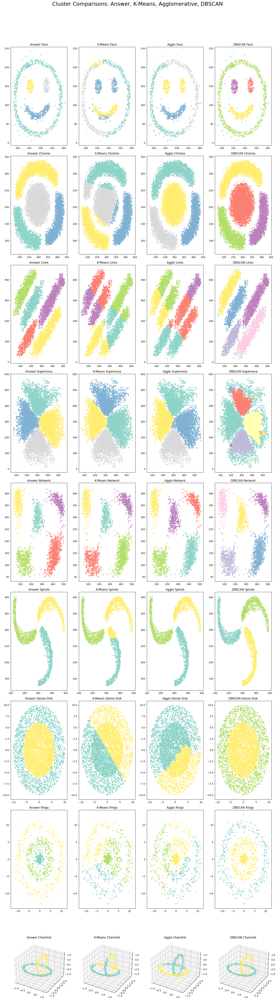

In [508]:
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plots
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(16, 60))  # Increase figure size for better visualization
fig.suptitle('Cluster Comparisons: Answer, K-Means, Agglomerative, DBSCAN', size=22)

# Arrays
datasets_answer = [face_df, chrome_df, lines2_df, supernova_df,
                   network_df, spirals_df, densedisk_df, rings_df,
                   chainlink_df]

datasets_kmeans = [face_df_kmeans, chrome_df_kmeans, lines2_df_kmeans, supernova_df_kmeans,
                   network_df_kmeans, spirals_df_kmeans, densedisk_df_kmeans, rings_df_kmeans,
                   chainlink_df_kmeans]

agglo = [y_Agglo_face, y_Agglo_chrome, y_Agglo_lines, y_Agglo_supernova,
         y_Agglo_network, y_Agglo_spirals, y_Agglo_densedisk, y_Agglo_rings,
         y_Agglo_chainlink]

dbScan = [y_dbScan_face, y_dbScan_chrome, y_dbScan_lines, y_dbScan_supernova,
         y_dbScan_network, y_dbScan_spirals, y_dbScan_densedisk, y_dbScan_rings,
         y_dbScan_chainlink]

titles = ["Face", "Chrome", "Lines", "Supernova", "Network",
          "Spirals", "Dense Disk", "Rings", "Chainlink"]

# Create subplots (9 rows for datasets, 4 columns for clustering methods)
axes = []
for i in range(9):
    row_axes = []
    for j in range(4):
        if i == 8:  # Last row (3D plots for Chainlink)
            row_axes.append(fig.add_subplot(9, 4, i * 4 + j + 1, projection='3d'))
        else:
            row_axes.append(fig.add_subplot(9, 4, i * 4 + j + 1))
    axes.append(row_axes)

# Iterate through datasets and add plots
for i, (answer, kmeans, agglo_labels, dbscan_labels, title) in enumerate(zip(datasets_answer, datasets_kmeans, agglo, dbScan, titles)):
    if i < 8:  # 2D datasets
        # Answer
        axes[i][0].scatter(answer['x'], answer['y'], c=answer['color'], s=10, cmap="Set3")
        axes[i][0].set_title(f"Answer {title}")

        # K-Means
        axes[i][1].scatter(kmeans['x'], kmeans['y'], c=kmeans['Cluster'], s=10, cmap="Set3")
        axes[i][1].set_title(f"K-Means {title}")

        # Agglomerative
        axes[i][2].scatter(answer['x'], answer['y'], c=agglo_labels, s=10, cmap="Set3")
        axes[i][2].set_title(f"Agglo {title}")

        # DBSCAN
        axes[i][3].scatter(answer['x'], answer['y'], c=dbscan_labels, s=10, cmap="Set3")
        axes[i][3].set_title(f"DBSCAN {title}")
    else:  # 3D dataset for Chainlink
        # Answer
        axes[i][0].scatter(answer['x'], answer['y'], answer['z'], c=answer['color'], s=10, cmap="Set3")
        axes[i][0].set_title(f"Answer {title}")

        # K-Means
        axes[i][1].scatter(kmeans['x'], kmeans['y'], kmeans['z'], c=kmeans['Cluster'], s=10, cmap="Set3")
        axes[i][1].set_title(f"K-Means {title}")

        # Agglomerative
        axes[i][2].scatter(answer['x'], answer['y'], answer['z'], c=agglo_labels, s=10, cmap="Set3")
        axes[i][2].set_title(f"Agglo {title}")

        # DBSCAN
        axes[i][3].scatter(answer['x'], answer['y'], answer['z'], c=dbscan_labels, s=10, cmap="Set3")
        axes[i][3].set_title(f"DBSCAN {title}")

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Reserve space for the suptitle
plt.show()
